<a href="https://colab.research.google.com/github/dqminhv/fraudulent-job-posting-detection-with-NLP/blob/main/notebook/fake_job_postings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Data and Cleaning

## **Import Required Packages**

In [ ]:
#import sys
#!{sys.executable} -m pip install -U ydata-profiling[notebook]
#!jupyter nbextension enable --py widgetsnbextension
#!pip install pydotplus

In [ ]:
import warnings
# Ignore all warnings (not recommended in general)
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd
import numpy as np

from sklearn import tree, metrics
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import classification_report
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

#import and download required packages for text data procesing
import nltk
#nltk.download('stopwords')
#nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
import re

import seaborn as sns
import matplotlib.pyplot as plt
from io import StringIO
from IPython.display import Image
#import pydotplus
import missingno as msno
from ydata_profiling import ProfileReport

## **Load data**

In [ ]:
#Load csv file to a pandas DataFrame
job_postings_data = pd.read_csv('https://raw.githubusercontent.com/dqminhv/Capstone_Project_2/main/Data/fake_job_postings.csv')

In [ ]:
#Let look at the first few row of th data frame
job_postings_data.head()

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0


In [ ]:
#Delete the job_id column since it has no use
job_postings_data.drop('job_id', axis=1, inplace=True)

## **Explore the data set**

### Use ydata-profiling to explore the data set.

In [ ]:
#profile = ProfileReport(job_postings_data, title="Pandas Profiling Report")

In [ ]:
#profile.to_file("Explore_Data.html")

In [ ]:
#profile.to_notebook_iframe()

In [ ]:
#Let look at the data type of each column and see if how many missing values there are
job_postings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   title                17880 non-null  object
 1   location             17534 non-null  object
 2   department           6333 non-null   object
 3   salary_range         2868 non-null   object
 4   company_profile      14572 non-null  object
 5   description          17879 non-null  object
 6   requirements         15184 non-null  object
 7   benefits             10668 non-null  object
 8   telecommuting        17880 non-null  int64 
 9   has_company_logo     17880 non-null  int64 
 10  has_questions        17880 non-null  int64 
 11  employment_type      14409 non-null  object
 12  required_experience  10830 non-null  object
 13  required_education   9775 non-null   object
 14  industry             12977 non-null  object
 15  function             11425 non-null  object
 16  frau

**It seems that the data set has many missing values. We will figure out how to address those missing values.**



### Dealing with missing values

<Axes: >

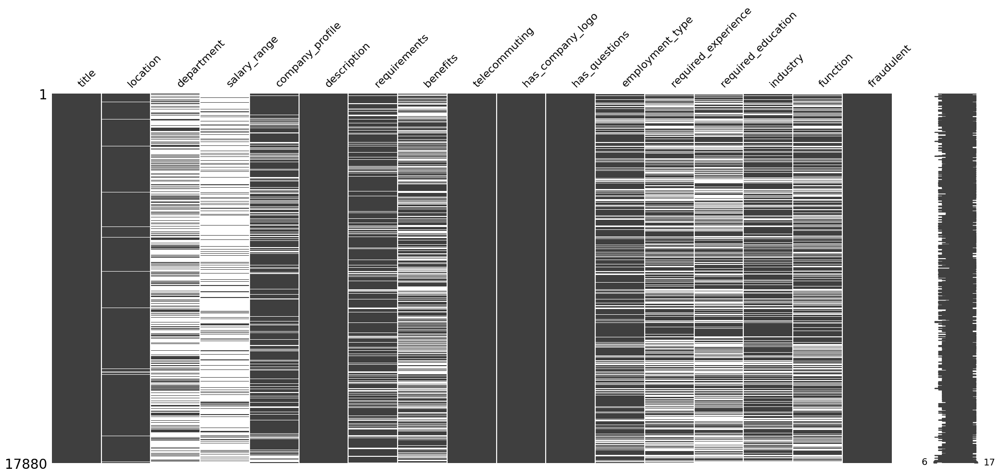

In [ ]:
#Let plot a missing values matrix
msno.matrix(job_postings_data)

**It seems that there are many variables with high missing-value rates. Intuitively, we should not simply drop these variables since the missing value could be an indicator of fraudulent job postings. We can make some count plots to see whether we can see any relationship between missing value and fraudulent postings.**

In [ ]:
#Let create a list of variables that have missing values
missing_value_var = job_postings_data.columns.drop(['title', 'description', 'telecommuting', 'has_company_logo', 'has_questions', 'fraudulent' ])

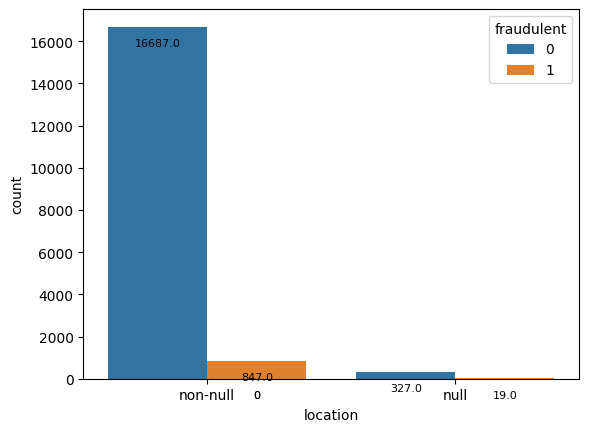

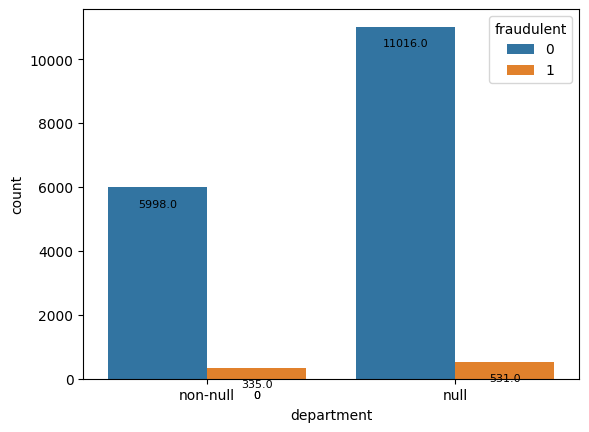

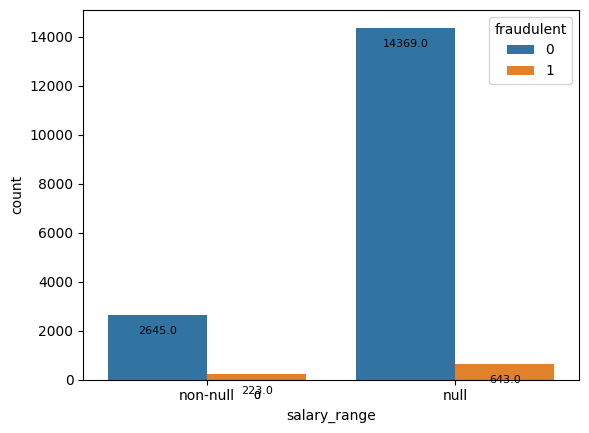

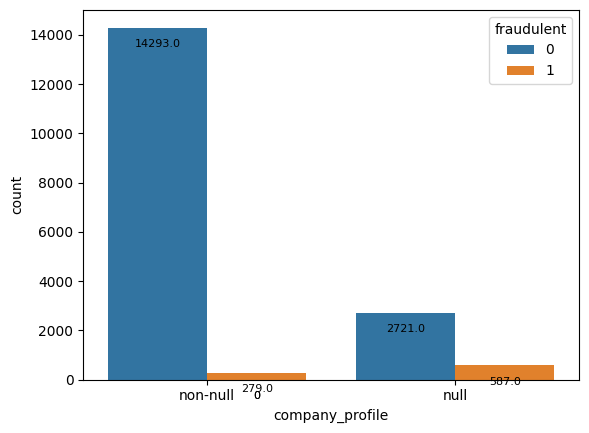

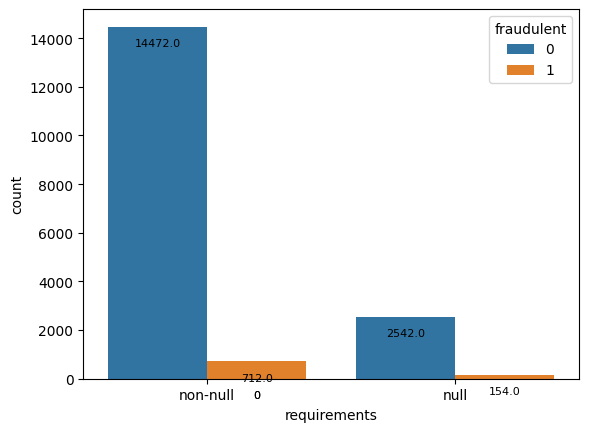

...

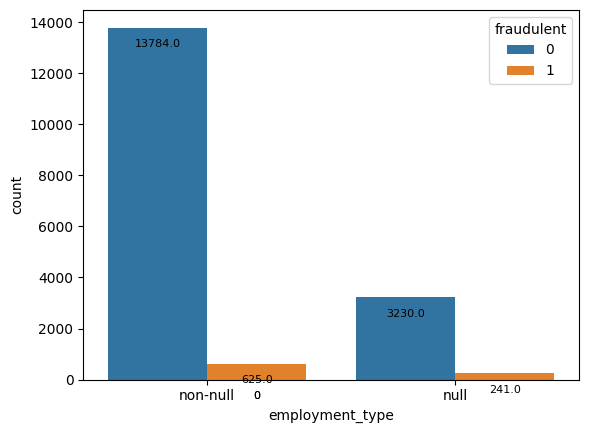

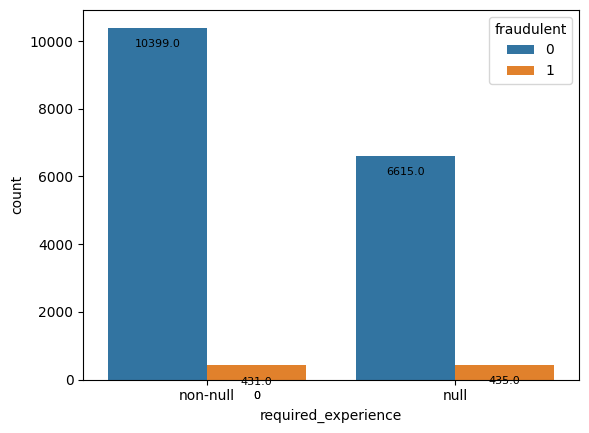

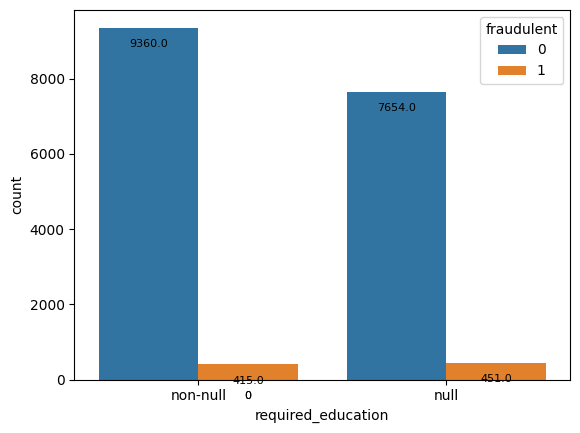

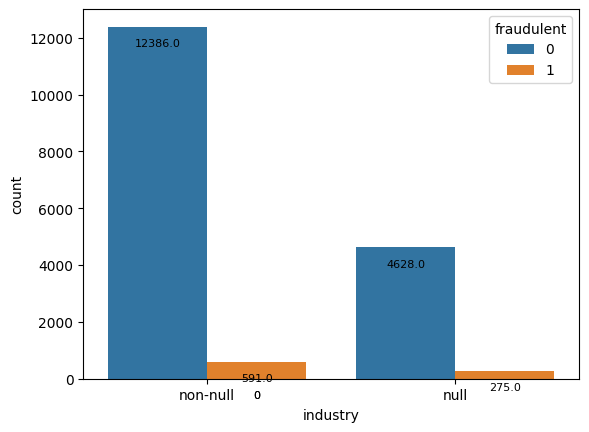

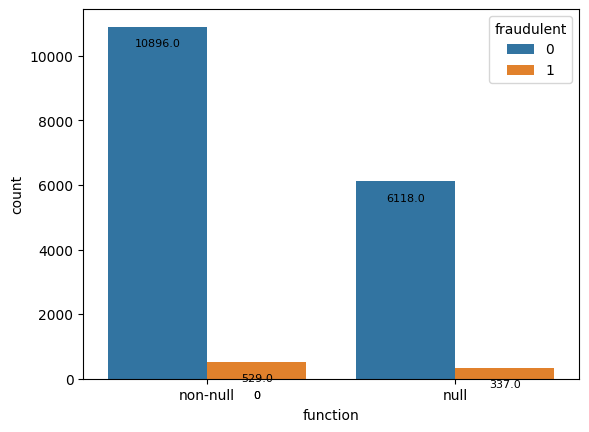

In [ ]:
#We create a 2-column sub-dataframe for each variable with missing values, which contains that variable and the fraudulent column. For each record of each variable, we simply transform its content to null or non-null.
#We then make a count plot for the number of real/fraudulent job postings for each null/non-null category
for var in missing_value_var:
  df = job_postings_data[[var, 'fraudulent']]
  df.loc[~df[var].isnull(), var] = 'non-null'
  df[var].fillna('null', inplace=True)
  _ = sns.countplot(x=var, data=df ,hue="fraudulent", order=['non-null', 'null'])
  for p in _.patches:
    _.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), ha='center', va='top', color='black', size=8)
  plt.show()

**From the plots above, it is difficult to conclude whether missing value is a sign of fraudulent job postings. We will keep those missing values and impute them with appropriate values. We see that all integer variables, 'telecommuting', 'has_company_logo', 'has_questions', and the predict variable, 'fraudulent', do not contain missing values. Thus, we will impute missing values for other variable with 'non-specified'.**

In [ ]:
job_postings_data.fillna('Not Specified', inplace=True)

In [ ]:
#Let check if there is any missing values
job_postings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   title                17880 non-null  object
 1   location             17880 non-null  object
 2   department           17880 non-null  object
 3   salary_range         17880 non-null  object
 4   company_profile      17880 non-null  object
 5   description          17880 non-null  object
 6   requirements         17880 non-null  object
 7   benefits             17880 non-null  object
 8   telecommuting        17880 non-null  int64 
 9   has_company_logo     17880 non-null  int64 
 10  has_questions        17880 non-null  int64 
 11  employment_type      17880 non-null  object
 12  required_experience  17880 non-null  object
 13  required_education   17880 non-null  object
 14  industry             17880 non-null  object
 15  function             17880 non-null  object
 16  frau

### Wragling Data

In [ ]:
#Let explore unique values for each variable.
#We should drop 'company_profile',	'description',	'requints',	'benefits' variables
#because these variables will most likely have a distinct value for each record.reme
for col in job_postings_data.drop(['company_profile',	'description',	'requirements',	'benefits'], axis=1).columns:
  print(job_postings_data.value_counts(col).sort_index())
  print('\n')
  print('***************************')

title
   Electrician                                                       1
   Environmental Technician I                                        1
   Piping Material Engineer                                          1
  Discipline Manager Civil, Structural, Marine, Architectural        1
  FEA Senior engineer                                                1
                                                                    ..
warehouse opperative                                                 1
web designer                                                         1
web project manager                                                  1
work from home                                                       1
~ LM Structures - Expression of Interest for Future Consideration    1
Name: count, Length: 11231, dtype: int64


***************************
location
AE, ,                       6
AE, , Abudhabi              1
AE, , Dubai                 6
AE, , Media City | Dubai    3
AE, AZ,      

**From the value count summary, we see that there are some values of some variables that can be classified as 'Not Specified', like 'Other', 'Not Applicable', 'Unspecified'. We should also trim the leading and trailing white spaces for variables of type string.**

In [ ]:
for col in job_postings_data.drop(['company_profile',	'description',	'requirements',	'benefits'], axis=1).columns:
  job_postings_data[col] = job_postings_data[col].replace(['Not Applicable','Unspecified'],'Not Specified')
  if job_postings_data[col].dtype == 'object':
    job_postings_data[col] = job_postings_data[col].str.strip()
  print(job_postings_data.value_counts(col).sort_index())
  print('\n')
  print('***************************')

title
$950/Week Truck Drivers Needed                                       1
$950/week. Truck Drivers Needed                                      1
(Assistant) Accountant                                               1
(Internship) Communication / E-Marketing Assistant                   1
(Internship) PR / Event Manager Assistant                            1
                                                                    ..
warehouse opperative                                                 1
web designer                                                         1
web project manager                                                  1
work from home                                                       1
~ LM Structures - Expression of Interest for Future Consideration    1
Name: count, Length: 10915, dtype: int64


***************************
location
AE, ,                       6
AE, , Abudhabi              1
AE, , Dubai                 6
AE, , Media City | Dubai    3
AE, AZ,      

**Let look at the location of the job postings data to see which country that job postings belong to.**

In [ ]:
#Create a split function to get the country code of the location variable
def get_country(location):
    l = location.split(',')
    return l[0]

In [ ]:
#Create a new column 'country_code' by spliting the location variable
job_postings_data['country_code'] = job_postings_data['location'].apply(get_country)

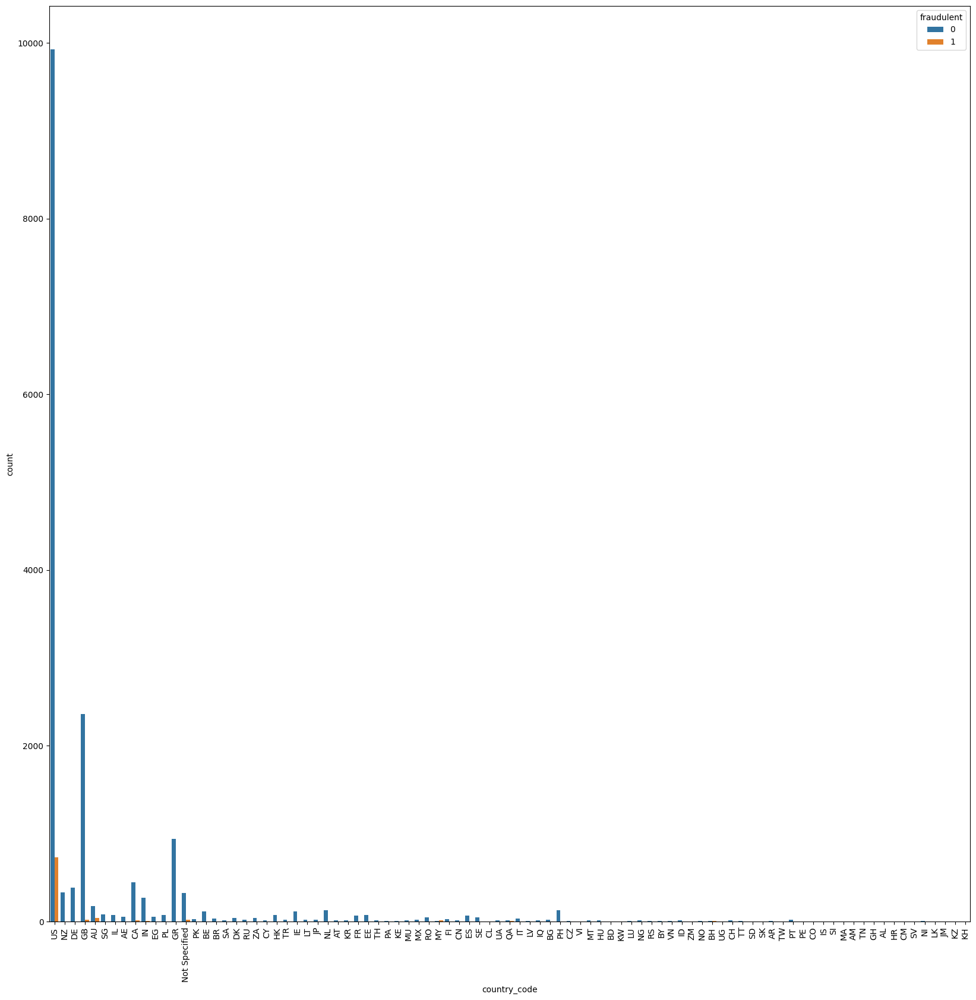

In [ ]:
#Let make a count plot for each country
fig, ax = plt.subplots(figsize=(20,20))
#ax.set_yscale('log')
_ = sns.countplot(x='country_code', data=job_postings_data, hue='fraudulent', ax=ax)
plt.xticks(rotation = 90, size=10)
plt.show()

It seems that most job postings and most fraudulent postings in this data set are in the United States. The number of job postings and fraudulent postings for other countries are insignificant with respect to those in the US. Thus, we will focus our model on job postings in the US. We will retain data for job postings in the US only.

In [ ]:
#Create a data set that contain only job postings in the United States
job_postings_data_US = job_postings_data[job_postings_data['country_code']=='US']

In [ ]:
#We can drop the country_code column since it has no use from now
job_postings_data_US = job_postings_data_US.drop('country_code', axis=1)
job_postings_data_US.reset_index(drop=True, inplace=True)

In [ ]:
job_postings_data_US.head()

,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
0,Marketing Intern,"US, NY, New York",Marketing,Not Specified,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,Not Specified,0,1,0,Other,Internship,Not Specified,Not Specified,Marketing,0
1,Commissioning Machinery Assistant (CMA),"US, IA, Wever",Not Specified,Not Specified,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,Not Specified,0,1,0,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified,0
2,Account Executive - Washington DC,"US, DC, Washington",Sales,Not Specified,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0
3,Bill Review Manager,"US, FL, Fort Worth",Not Specified,Not Specified,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0
4,Accounting Clerk,"US, MD,",Not Specified,Not Specified,Not Specified,Job OverviewApex is an environmental consultin...,Not Specified,Not Specified,0,0,0,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified,0


In [ ]:
job_postings_data_US.columns

Index(['title', 'location', 'department', 'salary_range', 'company_profile',
       'description', 'requirements', 'benefits', 'telecommuting',
       'has_company_logo', 'has_questions', 'employment_type',
       'required_experience', 'required_education', 'industry', 'function',
       'fraudulent'],
      dtype='object')

# Exploratory Data Analysis

Let's examine the distribution of the response variable (fraudulent column). We make a count plot for the two types of job postings and calculate the percentage of each category.

## **Explore Target Variable**

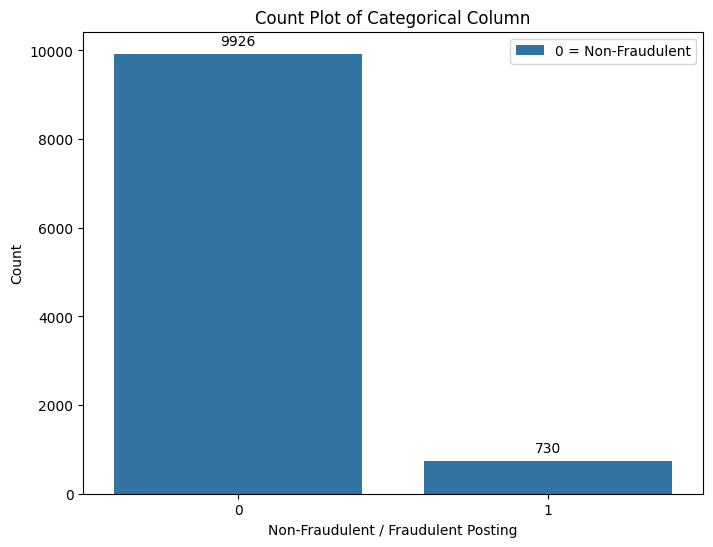

Percentage of fraudulent job postings: 6.85
Percentage of non-fraudulent job postings: 93.15


In [ ]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='fraudulent', data=job_postings_data_US)

# Display count values on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title("Count Plot of Categorical Column")
plt.xlabel("Non-Fraudulent / Fraudulent Posting")
plt.ylabel("Count")
plt.legend(labels=['0 = Non-Fraudulent', '1 = Fraudulent'])
plt.show()
fraud_counts = job_postings_data_US['fraudulent'].value_counts()
print('Percentage of fraudulent job postings: {:.2f}'.format( fraud_counts[1]/ len(job_postings_data_US['fraudulent'])*100))
print('Percentage of non-fraudulent job postings: {:.2f}'.format( fraud_counts[0]/ len(job_postings_data_US['fraudulent'])*100))

The data is very imbalanced. We'll keep this in mind when building and assessing the predictive model in the next step.

In [ ]:
job_postings_data_US.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10656 entries, 0 to 10655
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   title                10656 non-null  object
 1   location             10656 non-null  object
 2   department           10656 non-null  object
 3   salary_range         10656 non-null  object
 4   company_profile      10656 non-null  object
 5   description          10656 non-null  object
 6   requirements         10656 non-null  object
 7   benefits             10656 non-null  object
 8   telecommuting        10656 non-null  int64 
 9   has_company_logo     10656 non-null  int64 
 10  has_questions        10656 non-null  int64 
 11  employment_type      10656 non-null  object
 12  required_experience  10656 non-null  object
 13  required_education   10656 non-null  object
 14  industry             10656 non-null  object
 15  function             10656 non-null  object
 16  frau

## **Exploring Features**

The data set includes numerical features and categorical features. We will explore these two type of features. For each feature, we will examine its relationship with the response variable.

In [ ]:
#Let's split the features into two types

#Numerical features
num_fea = ['telecommuting', 'has_company_logo', 'has_questions']

#Categorical features
cat_fea = (job_postings_data_US.columns.drop(num_fea)).drop('fraudulent')

### Exploring Numerical Features

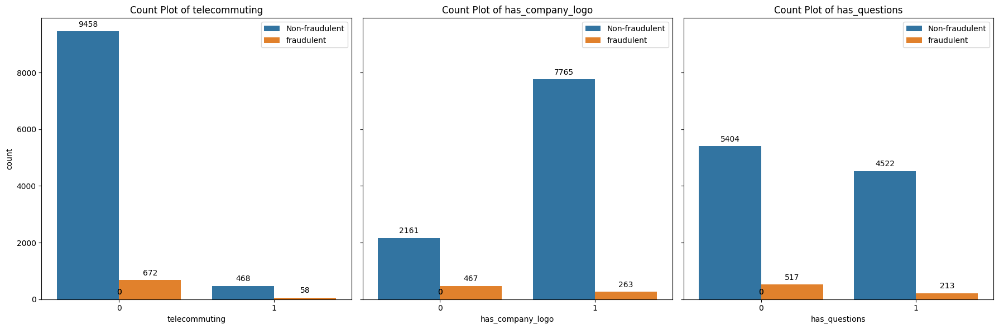

In [ ]:
#Create a count plot for each feature,
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)  # 1 row, 3 columns
plot = 0
for fea in num_fea:
  ax = sns.countplot(x=fea, data=job_postings_data_US, hue='fraudulent', ax=axes[plot])
  # Display count values on top of the bars
  for p in ax.patches:
      ax.annotate(format(p.get_height(), '.0f'),
                  (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha = 'center', va = 'center',
                  xytext = (0, 9),
                  textcoords = 'offset points')

  axes[plot].set_title("Count Plot of {}".format(fea))
  axes[plot].set_xlabel(fea)
  axes[plot].legend(labels=['Non-fraudulent', 'fraudulent'])
  plot += 1
plt.tight_layout()
plt.show()

There are some interesting insights from the count plots. Looking at each feature:


1.   For 'telecommuting" feature:


*   58/(58+468)*100 = 11.03% of job postings that provide telecommuting are actually fraudulent, while only
*   672/(672+9458)*100 = 6.63% of job postings that do not provide telecommuting are actually fraudulent

A job posting that provides telecommuting has nearly double the chance of being fraudulent.

2.   For 'has_company_logo' feature:


*   Only 263/(263+7765)*100 = 3.28% of job postings that have company logo are fraudulent, while up to
*   467/(467+2161)*100 = 17.78% of job postings that do not have a company logo are fraudulent.

A job posting that does not have a company logo is 6-time more likely to be fraudulent.
3. For 'has_question' feature:


*   517/(517+5404)*100 = 8.73% of job postings that have no asked questions are fraudulent, while only
*   213/(213+4522)*100 = 4.49% of job postings that have questions asked are fraudulent.
A job posting that has no asked question is twice more likely to be fraudulent.

These three features provide a good rule of thumb for predicting fraudulent job postings. A job that provides telecommuting, has no company logo, and does not has any questions asked is clearly a red flag.




### Exploring Categorical Features

Let have a look at the number of unique values for each categorical feature.

In [ ]:
for fea in cat_fea:
  print('There are {}'.format(job_postings_data_US[fea].nunique()), 'unique values for a total of {}'.format(len(job_postings_data_US[fea])), 'values in {}'.format(fea), 'feature\n')

There are 6294 unique values for a total of 10656 values in title feature

There are 1744 unique values for a total of 10656 values in location feature

There are 697 unique values for a total of 10656 values in department feature

There are 534 unique values for a total of 10656 values in salary_range feature

There are 886 unique values for a total of 10656 values in company_profile feature

There are 8260 unique values for a total of 10656 values in description feature

There are 6485 unique values for a total of 10656 values in requirements feature

There are 3077 unique values for a total of 10656 values in benefits feature

There are 6 unique values for a total of 10656 values in employment_type feature

There are 7 unique values for a total of 10656 values in required_experience feature

There are 13 unique values for a total of 10656 values in required_education feature

There are 125 unique values for a total of 10656 values in industry feature

There are 38 unique values for 

Looking at the number of unique values of each features, we can see that some of the features can be considered as categorical, such as **['employment_type', 'required_experience', 'required_education', 'function']**. Some features with many unique values are actually text data. We should explore those features in a different way. Those features includes **['company_profile', 'description', 'requirements', 'benefits']**. Other features such as **['title', 'location', 'department', 'salary_range', 'industry']** have many unique values due to inconsistency in data entry, and can be grouped in to fewer categories.



### Recategorizing categorical features

Some features such as ['title', 'location', 'department', 'salary_range', 'industry'] have various unique values due to data entry inconsistency. Thus, we will recategorize them in fewer categories.

In [ ]:
#Let remove non-letter character and tranform all the letters to lower case
job_postings_data_US['title'] = job_postings_data_US['title'].str.replace('[^a-zA-Z]',' ')
job_postings_data_US['title'] = job_postings_data_US['title'].str.lower()

job_postings_data_US['location'] = job_postings_data_US['location'].str.lower()

job_postings_data_US['department'] = job_postings_data_US['department'].str.replace('[^a-zA-Z]',' ')
job_postings_data_US['department'] = job_postings_data_US['department'].str.lower()

job_postings_data_US['salary_range'] = job_postings_data_US['salary_range'].str.lower()

job_postings_data_US['industry'] = job_postings_data_US['industry'].str.replace('[^a-zA-Z]',' ')
job_postings_data_US['industry'] = job_postings_data_US['industry'].str.lower()

In [ ]:

# Text vectorization
vectorizer = TfidfVectorizer()
X_1 = vectorizer.fit_transform(job_postings_data_US['title'])
X_2 = vectorizer.fit_transform(job_postings_data_US['location'])
X_3 = vectorizer.fit_transform(job_postings_data_US['department'])
X_4 = vectorizer.fit_transform(job_postings_data_US['salary_range'])
X_5 = vectorizer.fit_transform(job_postings_data_US['industry'])

# K-Means clustering
num_clusters = 10
kmeans1 = KMeans(n_clusters=num_clusters, random_state=42)
kmeans2 = KMeans(n_clusters=num_clusters, random_state=42)
kmeans3 = KMeans(n_clusters=num_clusters, random_state=42)
kmeans4 = KMeans(n_clusters=num_clusters, random_state=42)
kmeans5 = KMeans(n_clusters=num_clusters, random_state=42)

kmeans1.fit(X_1)
kmeans2.fit(X_2)
kmeans3.fit(X_3)
kmeans4.fit(X_4)
kmeans5.fit(X_5)

# Add cluster labels to DataFrame
job_postings_data_US['title_cluster'] = kmeans1.labels_
job_postings_data_US['location_cluster'] = kmeans2.labels_
job_postings_data_US['department_cluster'] = kmeans3.labels_
job_postings_data_US['salary_range_cluster'] = kmeans4.labels_
job_postings_data_US['industry_cluster'] = kmeans5.labels_

#### **title**

In [ ]:
# Print title clusters
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    print(job_postings_data_US[job_postings_data_US['title_cluster'] == cluster_id]['title'])
    print()

Cluster 0:
76       customer services associate - data entry
115                             entry level sales
130                             entry level sales
138                           data entry clerk ii
167               data entry/customer service rep
                           ...                   
10571    receptionist / data entry / office clerk
10583                            data entry clerk
10600                           data entry, admin
10609                remote data entry rep needed
10619                                  data entry
Name: title, Length: 155, dtype: object

Cluster 1:
30                         inside sales professional-omaha
38                    outside sales professional-st. cloud
39                      outside sales professional-oronoco
79                          regional sales director - west
88       pharmaceutical / compound sales representative...
                               ...                        
10495                            

In [ ]:
grouped_title_dict = {0:'english teacher abroad',
                 1: 'other',
                 2: 'engineer',
                 3: 'account manager',
                 4: 'administrator',
                 5: 'customer service',
                 6: 'manager',
                 7: 'sale representative',
                 8: 'developer',
                 9: 'assistant'}
job_postings_data_US['grouped_title'] = job_postings_data_US['title_cluster'].map(grouped_title_dict)

#### **location**

In [ ]:
# Print location clusters
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    print(job_postings_data_US[job_postings_data_US['location_cluster'] == cluster_id]['location'])
    print()

Cluster 0:
17          us, ma, waltham
83          us, ma, amherst
106       us, ma, haverhill
150       us, ma, cambridge
160          us, ma, boston
                ...        
10324     us, ma, cambridge
10327    us, ma, wilmington
10382        us, ma, accord
10505               us, ma,
10645     us, ma, cambridge
Name: location, Length: 312, dtype: object

Cluster 1:
13            us, tx, austin
23           us, tx, houston
40        us, tx, fort worth
53        us, tx, fort worth
75            us, tx, dallas
                ...         
10554    us, tx, san antonio
10584        us, tx, houston
10588        us, tx, houston
10621        us, tx, houston
10655        us, tx, houston
Name: location, Length: 852, dtype: object

Cluster 2:
79       us, ca, los angeles
126      us, ca, los angeles
208      us, ca, los angeles
210      us, ca, los angeles
301      us, ca, los angeles
                ...         
10607    us, ca, los angeles
10616    us, ca, los angeles
10623    us, ca, los

In [ ]:
grouped_location_dict = {0:'los angeles',
                 1: 'new york',
                 2: 'san francisco',
                 3: 'other',
                 4: 'texas',
                 5: 'las vegas',
                 6: 'san diego',
                 7: 'ohio',
                 8: 'albany',
                 9: 'florida'}
job_postings_data_US['grouped_location'] = job_postings_data_US['location_cluster'].map(grouped_location_dict)

#### **department**

In [ ]:
# Print department clusters
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    print(job_postings_data_US[job_postings_data_US['department_cluster'] == cluster_id]['department'])
    print()

Cluster 0:
1        not specified
3        not specified
4        not specified
5        not specified
6        not specified
             ...      
10649    not specified
10650    not specified
10652    not specified
10653    not specified
10655    not specified
Name: department, Length: 7618, dtype: object

Cluster 1:
112                  field operations
345                        operations
393               business operations
396                        operations
467                        operations
                     ...             
9702                       operations
9718                       operations
10215    operations, sales, marketing
10277                      operations
10356                      operations
Name: department, Length: 186, dtype: object

Cluster 2:
2        sales
79       sales
88       sales
102      sales
180      sales
         ...  
10495    sales
10535    sales
10547    sales
10607    sales
10626    sales
Name: department, Length: 347, dtype: 

In [ ]:
grouped_department_dict = {0:'not specified',
                 1: 'sales',
                 2: 'engineering',
                 3: 'marketing',
                 4: 'other',
                 5: 'operation',
                 6: 'technology',
                 7: 'it',
                 8: 'product',
                 9: 'customer service'}
job_postings_data_US['grouped_department'] = job_postings_data_US['department_cluster'].map(grouped_department_dict)

#### **salary_range**

In [ ]:
# Print salary_range clusters
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    print(job_postings_data_US[job_postings_data_US['salary_range_cluster'] == cluster_id]['salary_range'])
    print()

Cluster 0:
0        not specified
1        not specified
2        not specified
3        not specified
4        not specified
             ...      
10650    not specified
10651    not specified
10652    not specified
10654    not specified
10655    not specified
Name: salary_range, Length: 9099, dtype: object

Cluster 1:
27       40000-50000
217      40000-50000
236      40000-50000
678      40000-50000
849      40000-50000
928      40000-50000
1028     40000-50000
1061     40000-50000
1279     40000-50000
1324     40000-50000
1338     40000-50000
1408     40000-50000
1437     40000-50000
1523     40000-50000
1551     40000-50000
1590     40000-50000
1663     40000-50000
2185     40000-50000
2495     40000-50000
2602     40000-50000
2705     40000-50000
2901     40000-50000
3175           40000
3738     40000-50000
3784     40000-50000
3810     40000-50000
3922     40000-50000
4068     40000-50000
4092     40000-50000
4320     40000-50000
4344     40000-50000
4433         0-50000
5087

Note: The salary_range is difficult to cluster in to group. Thus, we ignore that feature in the recategorizing process.

#### **industry**

In [ ]:
# Print industry clusters
for cluster_id in range(num_clusters):
    print(f"Cluster {cluster_id}:")
    print(job_postings_data_US[job_postings_data_US['industry_cluster'] == cluster_id]['industry'])
    print()

Cluster 0:
0        not specified
1        not specified
4        not specified
5        not specified
11       not specified
             ...      
10639    not specified
10640    not specified
10645    not specified
10647    not specified
10655    not specified
Name: industry, Length: 2682, dtype: object

Cluster 1:
3          hospital & health care
10                events services
19                   construction
28              consumer services
30             building materials
                   ...           
10643            medical practice
10646    motion pictures and film
10648             pharmaceuticals
10649                      retail
10652                   utilities
Name: industry, Length: 3661, dtype: object

Cluster 2:
90       telecommunications
94       telecommunications
100      telecommunications
271      telecommunications
273      telecommunications
                ...        
10472    telecommunications
10477    telecommunications
10493    telecommunication

In [ ]:
grouped_industry_dict = {0:'marketing and advertising',
                 1: 'computer software',
                 2: 'engineer',
                 3: 'financial service',
                 4: 'internet',
                 5: 'other',
                 6: 'management',
                 7: 'information technology and service',
                 8: 'oil and energy',
                 9: 'real estate'}
job_postings_data_US['grouped_industry'] = job_postings_data_US['industry_cluster'].map(grouped_industry_dict)

#### Create count plot for each categorical feature

In [ ]:
#Let sub-group the categorical features
cat_fea_2 = ['employment_type', 'required_experience', 'required_education', 'function',
    'grouped_title', 'grouped_location', 'grouped_department', 'grouped_industry']

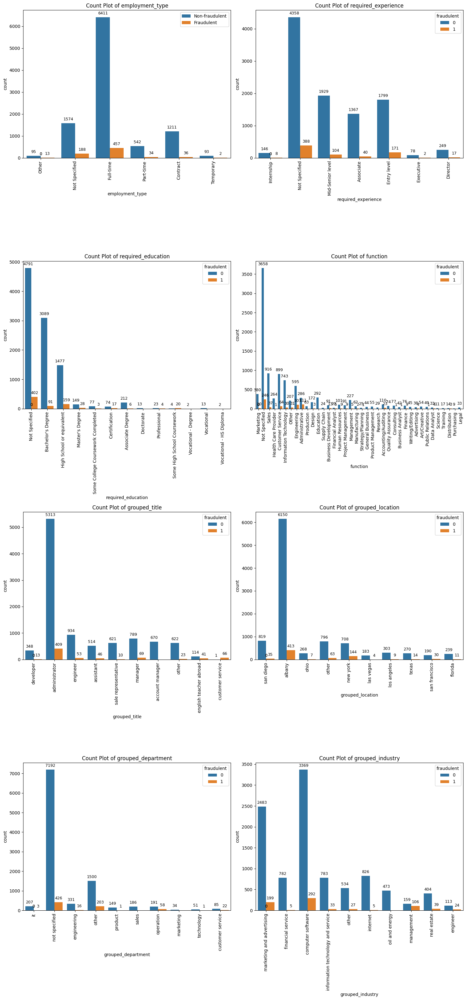

In [ ]:
# Set the number of rows and columns for subplots
num_rows = len(cat_fea_2) // 2
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 8*num_rows))

# Flatten the axes array to make it easier to iterate
axes = axes.flatten()

# Iterate through features
for i, fea in enumerate(cat_fea_2):
    # Choose the subplot for the current feature
    ax = axes[i]

    # Plot countplot
    sns.countplot(x=fea, data=job_postings_data_US, hue='fraudulent', ax=ax)

    # Display count values on top of the bars
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center',
                    xytext=(0, 9),
                    fontsize=9,
                    textcoords='offset points')

    # Set subplot title, xlabel, and rotate xticks
    ax.set_title("Count Plot of {}".format(fea))
    ax.set_xlabel(fea)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    # Add legend only to the first subplot
    if i == 0:
        ax.legend(labels=['Non-fraudulent', 'Fraudulent'])

# Adjust layout
plt.tight_layout()
plt.show()

#### Percentage of frauduent job postings in each category

In [ ]:
#For each feature, calculate the percentage of frauduent job postings in each category
#Calculate the percentage of fraudulent postings for each feature
#Print out the result in descending order of the percentage of fraudulent postings
for fea in cat_fea_2:
  fraud_percentage = job_postings_data_US.groupby([fea])['fraudulent'].agg(['mean', 'count']).reset_index()

  # Rename columns for clarity
  fraud_percentage.rename(columns={'mean': 'fraud_percentage', 'count': 'total_count'}, inplace=True)

  # Calculate the percentage
  fraud_percentage['fraud_percentage'] = np.round(fraud_percentage['fraud_percentage'] * 100,2)

  # Print the result
  print(fraud_percentage.sort_values(by='fraud_percentage', ascending=False))

  employment_type  fraud_percentage  total_count
3           Other             12.04          108
2   Not Specified             10.67         1762
1       Full-time              6.65         6868
4       Part-time              5.90          576
0        Contract              2.89         1247
5       Temporary              2.11           95
  required_experience  fraud_percentage  total_count
2         Entry level              8.68         1970
6       Not Specified              8.18         4746
1            Director              6.39          266
4          Internship              5.19          154
5    Mid-Senior level              5.12         2033
0           Associate              2.84         1407
3           Executive              2.50           80
                   required_education  fraud_percentage  total_count
9         Some High School Coursework             83.33           24
2                       Certification             18.68           91
5                     Mast

In [ ]:
# Create an empty DataFrame to store the results
result_df = pd.DataFrame()

for fea in cat_fea_2:
    fraud_percentage = job_postings_data_US.groupby([fea])['fraudulent'].agg(['mean', 'count']).reset_index()

    # Rename columns for clarity
    fraud_percentage.rename(columns={'mean': 'fraud_percentage', 'count': 'total_count'}, inplace=True)

    # Calculate the percentage
    fraud_percentage['fraud_percentage'] = np.round(fraud_percentage['fraud_percentage'] * 100, 2)

    # Sort the DataFrame by fraud_percentage
    fraud_percentage = fraud_percentage.sort_values(by='fraud_percentage', ascending=False)

    # Print the result
    print(fraud_percentage)

    # Append the result to the final DataFrame
    result_df = pd.concat([result_df, fraud_percentage])

# Save the final DataFrame to a CSV file
result_df.to_csv('fraud_percentage_results.csv', index=False)

  employment_type  fraud_percentage  total_count
3           Other             12.04          108
2   Not Specified             10.67         1762
1       Full-time              6.65         6868
4       Part-time              5.90          576
0        Contract              2.89         1247
5       Temporary              2.11           95
  required_experience  fraud_percentage  total_count
2         Entry level              8.68         1970
6       Not Specified              8.18         4746
1            Director              6.39          266
4          Internship              5.19          154
5    Mid-Senior level              5.12         2033
0           Associate              2.84         1407
3           Executive              2.50           80
                   required_education  fraud_percentage  total_count
9         Some High School Coursework             83.33           24
2                       Certification             18.68           91
5                     Mast

From the above result, there are some interesting findings:
1. employment_type that is 'other' or 'Not Specified' has a higher rate of fraud than the others.
2. require_experience 'Entry level' and 'Not Specified' has the highest fraud rate.
3. For required_education, 'Some high school course work' has a significantly higher rate of fraud than other requirements.
4. Job positions that are in Las Vegas and Florida have higher rate of fraud than other locations.
5. Industry that has highest fraudulent job postings is 'oil and energy'
6. 'engineering' and 'customer service' are departments that have highest rate of fraud. This might be because engineering and customer service are the most commom departments.

From the above findings, we can deduce some rules of thumb to red flag a job posting. Fraudulent job postings are less likely to be specific, require low entry level and experiences, and are more common in more common departments.

### Text features

#### Standardize text **features**

In [ ]:
#Create a list of text features
text = ['company_profile', 'description', 'requirements', 'benefits']

In [ ]:
#Let standardize the text features (lowercase and letter numeric characters only)
for fea in text:
  job_postings_data_US[fea] = job_postings_data_US[fea].str.lower()
  job_postings_data_US[fea] = job_postings_data_US[fea].str.replace('[^a-zA-Z0-9]',' ')
  print(job_postings_data_US[fea].head())

0    we're food52, and we've created a groundbreaki...
1    valor services provides workforce solutions th...
2    our passion for improving quality of life thro...
3    spotsource solutions llc is a global human cap...
4                                        not specified
Name: company_profile, dtype: object
0    food52, a fast-growing, james beard award-winn...
1    our client, located in houston, is actively se...
2    the company: esri – environmental systems rese...
3    job title: itemization review managerlocation:...
4    job overviewapex is an environmental consultin...
Name: description, dtype: object
0    experience with content management systems a m...
1    implement pre-commissioning and commissioning ...
2    education: bachelor’s or master’s in gis, busi...
3    qualifications:rn license in the state of texa...
4                                        not specified
Name: requirements, dtype: object
0                                        not specified
1               

#### Count number of characters, words, and determine the average word length of the text features

In [ ]:
#Create a character count column for each text feature
for fea in text:
  job_postings_data_US[fea+'_char_count'] = job_postings_data_US[fea].str.len()

#Create a word count column word count for each text feature
for fea in text:
  job_postings_data_US[fea+'_word_count'] = job_postings_data_US[fea].str.split().str.len()

#Create an average word length column avg_word_len for each text feature
for fea in text:
  #To avoid dividing by 0, we'll assign avg_word_len = 1 if either char_count = 0 or word_count = 0
  job_postings_data_US[fea+'_avg_word_len'] = np.where(job_postings_data_US[fea+'_word_count'] > 0,
                                                      job_postings_data_US[fea+'_char_count'] / job_postings_data_US[fea+'_word_count'],1)

#### Exploratory Statistics for character count, word count, and average word length

In [ ]:
job_postings_data_US[['company_profile_char_count', 'description_char_count',
       'requirements_char_count', 'benefits_char_count']].describe()

,company_profile_char_count,description_char_count,requirements_char_count,benefits_char_count
count,10656.000000,10656.000000,10656.000000,10656.000000
mean,581.102196,1281.590184,590.767643,185.826577
std,534.655352,955.105273,630.964428,306.227914
min,13.000000,6.000000,1.000000,1.000000
25%,53.000000,615.000000,130.000000,13.000000
50%,552.000000,1086.000000,444.000000,19.000000
75%,869.000000,1697.000000,815.250000,251.000000
max,4007.000000,14907.000000,6209.000000,4429.000000


In [ ]:
job_postings_data_US[['company_profile_word_count', 'description_word_count',
       'requirements_word_count', 'benefits_word_count']].describe()

,company_profile_word_count,description_word_count,requirements_word_count,benefits_word_count
count,10656.000000,10656.000000,10656.000000,10656.000000
mean,85.939189,175.246246,77.527121,26.404561
std,80.340490,128.762121,83.296952,44.772560
min,1.000000,0.000000,0.000000,0.000000
25%,10.000000,87.000000,18.000000,2.000000
50%,77.000000,150.000000,59.000000,3.000000
75%,131.000000,234.000000,106.000000,34.000000
max,588.000000,2115.000000,858.000000,694.000000


In [ ]:
job_postings_data_US[['company_profile_avg_word_len', 'description_avg_word_len',
       'requirements_avg_word_len', 'benefits_avg_word_len']].describe()

,company_profile_avg_word_len,description_avg_word_len,requirements_avg_word_len,benefits_avg_word_len
count,10656.000000,10656.000000,10656.000000,10656.000000
mean,6.976521,7.518332,7.499361,7.011730
std,4.187572,2.299771,1.297979,1.641903
min,5.075758,1.000000,1.000000,1.000000
25%,6.357798,6.682654,6.533333,6.500000
50%,6.500000,7.233908,7.415558,6.500000
75%,7.125000,7.816092,8.050000,7.161290
max,70.000000,110.555556,74.500000,70.000000


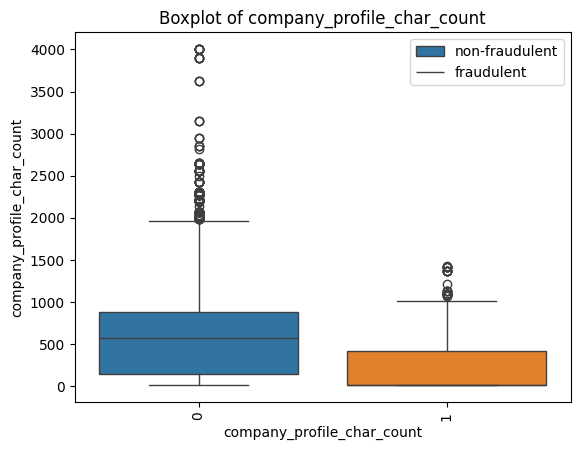

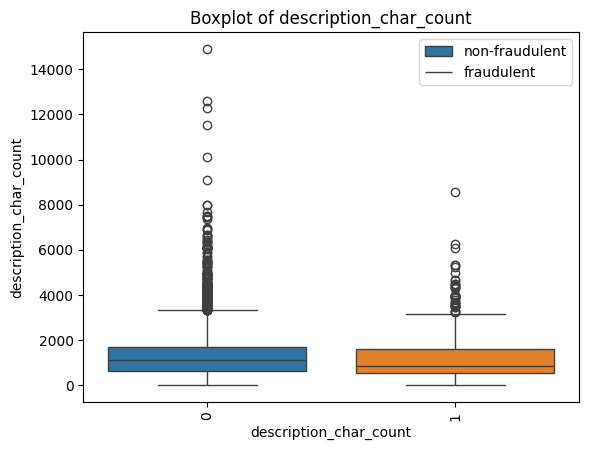

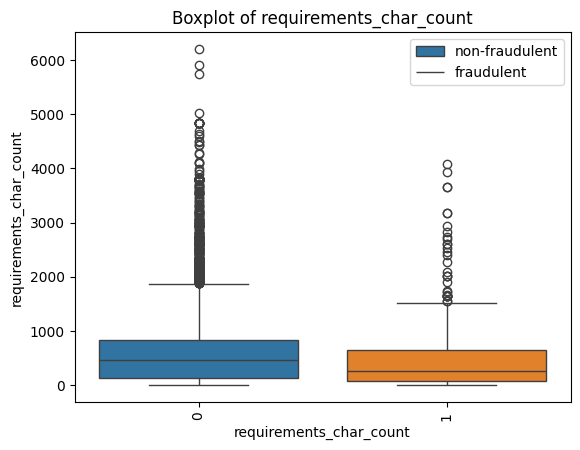

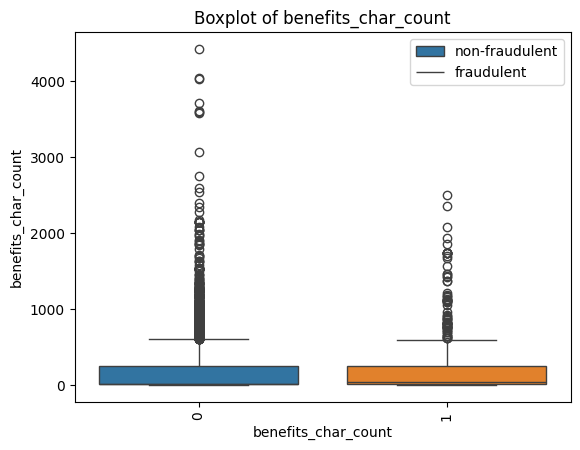

In [ ]:
#For each text feature, calculate the mean and standard deviation of character count for fraudulent and non-fraudulent job postings
#Create a histogram to compare
for fea in text:
  sns.boxplot(job_postings_data_US, x='fraudulent', y=fea+'_char_count', hue='fraudulent')
  plt.title("Boxplot of {}".format(fea+'_char_count'))
  plt.xlabel(fea+'_char_count')
  plt.xticks(rotation=90)
  plt.legend(labels=['non-fraudulent', 'fraudulent'])
  plt.show()

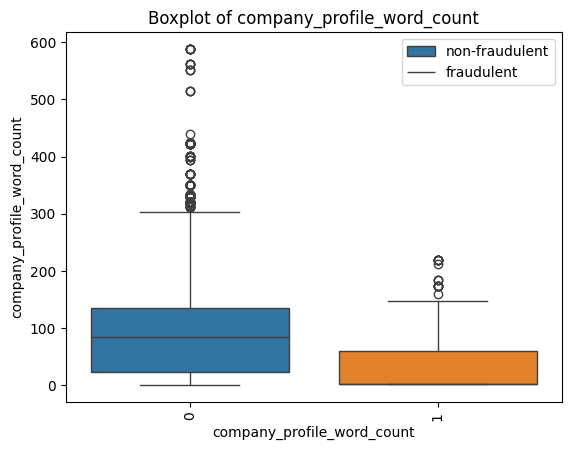

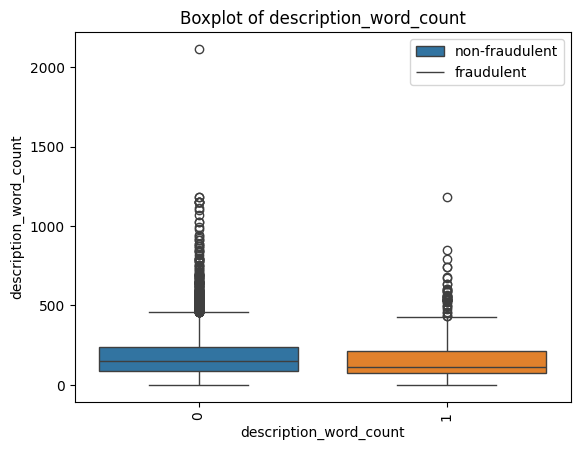

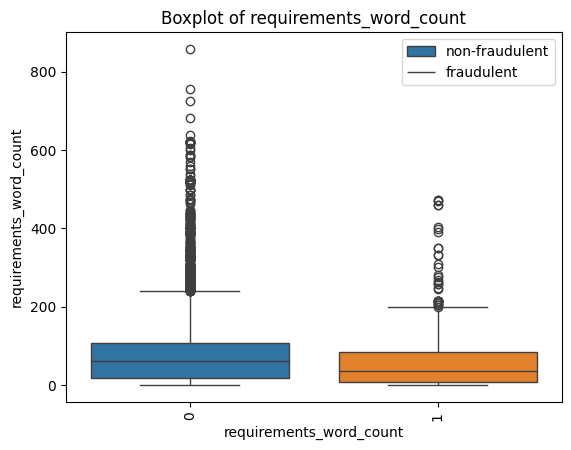

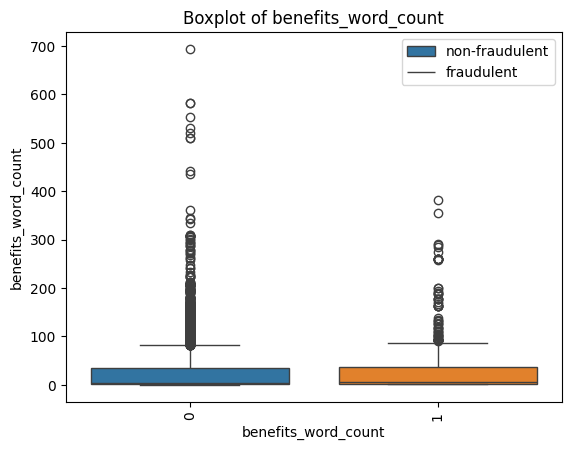

In [ ]:
#For each text feature, calculate the mean and standard deviation of word count for fraudulent and non-fraudulent job postings
#Create a histogram to compare
for fea in text:
  sns.boxplot(job_postings_data_US, x='fraudulent', y=fea+'_word_count', hue='fraudulent')
  plt.title("Boxplot of {}".format(fea+'_word_count'))
  plt.xlabel(fea+'_word_count')
  plt.xticks(rotation=90)
  plt.legend(labels=['non-fraudulent', 'fraudulent'])
  plt.show()

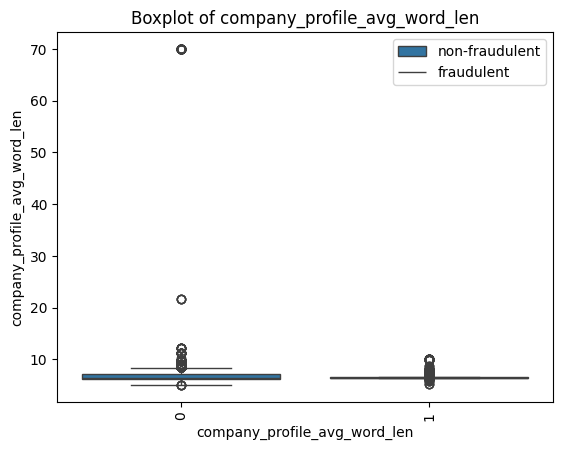

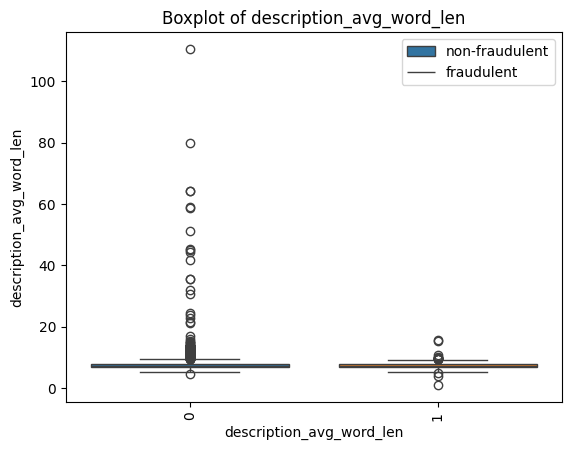

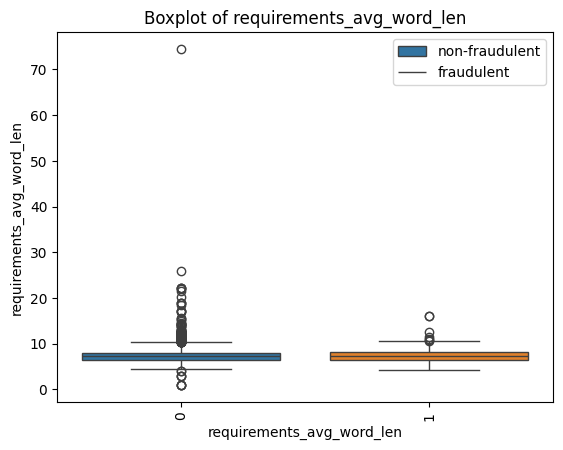

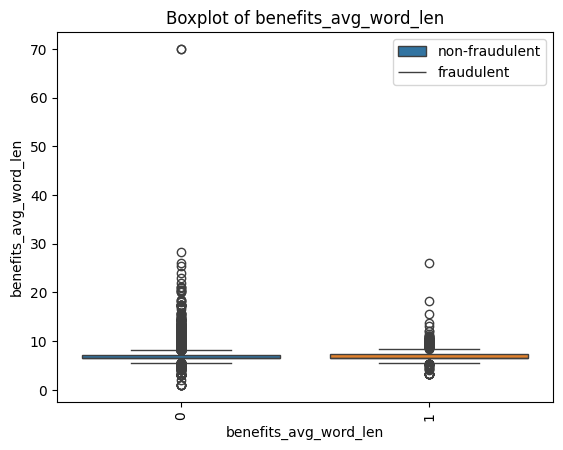

In [ ]:
#For each text feature, calculate the mean and standard deviation of average word length count for fraudulent and non-fraudulent job postings
#Create a histogram to compare
for fea in text:
  sns.boxplot(job_postings_data_US, x='fraudulent', y=fea+'_avg_word_len', hue='fraudulent')
  plt.title("Boxplot of {}".format(fea+'_avg_word_len'))
  plt.xlabel(fea+'_avg_word_len')
  plt.xticks(rotation=90)
  plt.legend(labels=['non-fraudulent', 'fraudulent'])
  plt.show()

From the above boxplots, we see that there is not much difference in text length of 'description', 'requirement', and 'benefits' between fraudulent and non-fraudulent job postings. However, there is a significant different in 'company_profile'. Non-fraudulent postings have longer company profile description in term of character count and word count.

### ydata profiling for new features




We will reapply ydata profiling for the data set with new and updated features.


*   We will see how the variables interact with each other.
*   We will see if there is any correlation between each variable with the target value.
*   For text features, we will look for text pattern and create a word cloud for each variable.


In [ ]:
#List of features to apply ydata profile
new_fea = ['company_profile', 'description', 'requirements', 'benefits', 'employment_type',
           'telecommuting','has_company_logo', 'has_questions',
            'required_experience', 'required_education', 'function',
            'fraudulent',
            'grouped_title','grouped_location', 'grouped_department', 'grouped_industry',
            'company_profile_word_count', 'description_word_count', 'requirements_word_count', 'benefits_word_count',
            'company_profile_avg_word_len', 'description_avg_word_len','requirements_avg_word_len', 'benefits_avg_word_len']

In [ ]:
#Remove stop words for text features
#Function to remove stopwords
stop_words = set(stopwords.words('english'))
def remove_stopwords(text):
    tokens = text.split()  # Split the text into tokens
    tokens = [word for word in tokens if word.lower() not in stop_words]  # Remove stopwords
    return ' '.join(tokens)  # Join the remaining tokens back into a string

#Apply the function to the DataFrame
for fea in text:
  job_postings_data_US[fea] = job_postings_data_US[fea].apply(remove_stopwords)

In [ ]:
#Run the below lines to get the ydata-profiling report
profile2 = ProfileReport(job_postings_data_US[new_fea], title="Categorical Features Profiling Report")
profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#Run this line of code to save the ydata-profiling report to an html file
#profile2.to_file("EDA.html")

The ydata profile report indicates some features that are highly correlated with the target value
* has_company_logo
* company_profile_word_count

Some variables are highly imbalance
* telecommuting
* required_education
* grouped_department
* description_avg_word_len

The heatmap shows that there is little interaction between variables.
The updated data frame has three types of variable
* Categorical: **['employment_type', 'required_experience', 'required_education', 'function', 'grouped_title', 'grouped_location', 'grouped_department', 'grouped_industry']**

* Numerical: **['telecommuting', 'has_company_logo','has_questions', 'company_profile_char_count', 'description_char_count', 'requirements_char_count', 'benefits_char_count', 'company_profile_word_count', 'description_word_count', 'requirements_word_count', 'benefits_word_count','company_profile_avg_word_len', 'description_avg_word_len', 'requirements_avg_word_len', 'benefits_avg_word_len']**

* Text: **['company_profile', 'description', 'requirements', 'benefits']**

# Preprocessing and Training Data Development

## Updating the dataframe

In [ ]:
#Let's look at the columns of the dataframe
job_postings_data_US.columns

Index(['title', 'location', 'department', 'salary_range', 'company_profile',
       'description', 'requirements', 'benefits', 'telecommuting',
       'has_company_logo', 'has_questions', 'employment_type',
       'required_experience', 'required_education', 'industry', 'function',
       'fraudulent', 'title_cluster', 'location_cluster', 'department_cluster',
       'salary_range_cluster', 'industry_cluster', 'grouped_title',
       'grouped_location', 'grouped_department', 'grouped_industry',
       'company_profile_char_count', 'description_char_count',
       'requirements_char_count', 'benefits_char_count',
       'company_profile_word_count', 'description_word_count',
       'requirements_word_count', 'benefits_word_count',
       'company_profile_avg_word_len', 'description_avg_word_len',
       'requirements_avg_word_len', 'benefits_avg_word_len'],
      dtype='object')

In [ ]:
#Let remove the cluster and grouped columns and character count columns that were created during the EDA process
#We also remove the word count and average word length columns of 'description', 'requirements' and 'benefits' because there are no significant difference in those values between fraudulent
#and non fraudulent job lostings
df = job_postings_data_US.drop(['title_cluster', 'location_cluster', 'department_cluster', 'salary_range_cluster', 'industry_cluster',
                           'grouped_title', 'grouped_location', 'grouped_department', 'grouped_industry',
                           'company_profile_char_count', 'description_char_count', 'requirements_char_count', 'benefits_char_count',
                           'description_word_count', 'requirements_word_count', 'benefits_word_count',
                            'description_avg_word_len', 'requirements_avg_word_len', 'benefits_avg_word_len'], axis=1)

In [ ]:
#Let take a look at the new dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10656 entries, 0 to 10655
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   title                         10656 non-null  object 
 1   location                      10656 non-null  object 
 2   department                    10656 non-null  object 
 3   salary_range                  10656 non-null  object 
 4   company_profile               10656 non-null  object 
 5   description                   10656 non-null  object 
 6   requirements                  10656 non-null  object 
 7   benefits                      10656 non-null  object 
 8   telecommuting                 10656 non-null  int64  
 9   has_company_logo              10656 non-null  int64  
 10  has_questions                 10656 non-null  int64  
 11  employment_type               10656 non-null  object 
 12  required_experience           10656 non-null  object 
 13  r

In [ ]:
#Combine all features into a single column
df_combine = df.drop(['fraudulent', 'company_profile_word_count', 'company_profile_avg_word_len'], axis=1)

In [ ]:
#Let transform ['telecommuting', 'has_company_logo', 'has_question'] into text features
df_combine.loc[df_combine.telecommuting == 1, 'telecommuting'] = 'telecommuting'
df_combine.loc[df_combine.telecommuting == 0, 'telecommuting'] = 'no-telecommuting'

df_combine.loc[df_combine.has_company_logo == 1, 'has_company_logo'] = 'has-logo'
df_combine.loc[df_combine.has_company_logo == 0, 'has_company_logo'] = 'no-logo'

df_combine.loc[df_combine.has_questions == 1, 'has_questions'] = 'has-questions'
df_combine.loc[df_combine.has_questions == 0, 'has_questions'] = 'no-question'

In [ ]:
#Combine all features into one column
df_combine["text"]=""
for col in df_combine.columns:
    df_combine["text"]=df_combine["text"]+" "+df_combine[col]

In [ ]:
#Drop all of other columns in df_text
df_combine = df_combine[['text']]

## Preprocessing Text Features

In [ ]:
#Create a function to clean the text feature
stop=set(stopwords.words("english"))

def clean(text):
    text=text.lower()
    obj=re.compile(r"<.*?>")                     #removing html tags
    text=obj.sub(r" ",text)
    obj=re.compile(r"https://\S+|http://\S+")    #removing url
    text=obj.sub(r" ",text)
    obj=re.compile(r"[^\w\s]")                   #removing punctuations
    text=obj.sub(r" ",text)
    obj=re.compile(r"\d{1,}")                    #removing digits
    text=obj.sub(r" ",text)
    obj=re.compile(r"_+")                        #removing underscore
    text=obj.sub(r" ",text)
    obj=re.compile(r"\s\w\s")                    #removing single character
    text=obj.sub(r" ",text)
    obj=re.compile(r"\s{2,}")                    #removing multiple spaces
    text=obj.sub(r" ",text)


    stemmer = SnowballStemmer("english")
    text=[stemmer.stem(word) for word in text.split() if word not in stop]

    return " ".join(text)

In [ ]:
#Apply text cleaning function to the data
df_combine["text"]=df_combine["text"].apply(clean)

## Spliting Data into Training and Testing Sets

In [ ]:
y = df["fraudulent"]

In [ ]:
X = df_combine['text']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(8524,)
(8524,)
(2132,)
(2132,)


# Modeling

**We will try 3 models**
* Naive Bayes Classifier for Multinomial
* Linear Support Vector Machine
* Logistic Regression

**The data set is very imbalanced. The percentage of non-fraudulent job postings are very high (93.15%). We want to minimize the chance that a fraudulent job is classified as non-fraudulent (minimize false-negative). We will, therefore, evaluate the models based on the recall score.**

## Vectorizing the data set

In [ ]:
#Parameters
stop_words = 'english'
min_df = 0.0
max_df = 1.0
ngram_range=(1, 1)

In [ ]:
#Using CountVectorizer
count_vect = CountVectorizer(stop_words=stop_words, max_df=max_df, min_df=min_df, ngram_range=ngram_range)

In [ ]:
#Using TfidfVectorizer
tfidf_vect = TfidfVectorizer(stop_words=stop_words, max_df=max_df, min_df=min_df, ngram_range=ngram_range)

## Naive Bayes Classifier for Multinomial Models

### Modeling

In [ ]:
# Create a text classification pipeline
nb_text_clf = Pipeline([('vect', count_vect),
               ('clf', MultinomialNB()),
              ])
nb_text_clf.fit(X_train, y_train)


# Make predictions on the test data
y_pred = nb_text_clf.predict(X_test)

### Model Evaluation

In [ ]:
#Precision Score
print('recall %s' % metrics.recall_score(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred, target_names=['Non-Fraudulent', 'Fraudulent']))

recall 0.726027397260274
                precision    recall  f1-score   support

Non-Fraudulent       0.98      0.98      0.98      1986
    Fraudulent       0.73      0.73      0.73       146

      accuracy                           0.96      2132
     macro avg       0.85      0.85      0.85      2132
  weighted avg       0.96      0.96      0.96      2132



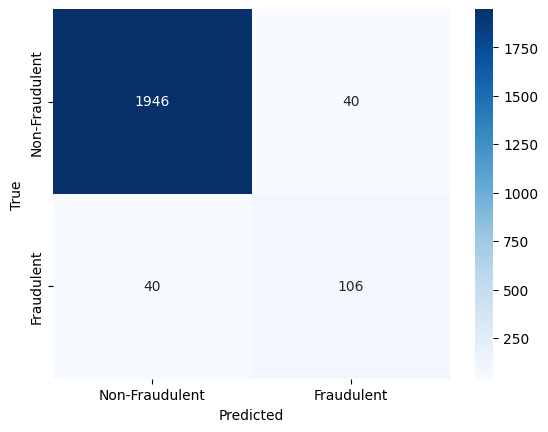

In [ ]:
#Confusion Matrix
cm1 = metrics.confusion_matrix(y_test, y_pred)

# Creating a heatmap for better visualization
sns.heatmap(cm1, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'],
            yticklabels=['Non-Fraudulent', 'Fraudulent'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Linear Support Vector Machine

### Modeling

In [ ]:
# Create a text classification pipeline
svm_text_clf = Pipeline([
    ('vect', count_vect),  # Text vectorization using CountVectorizer
    ('clf', SVC()),                # SVM classifier
])

# Fit the model on the training data
svm_text_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = svm_text_clf.predict(X_test)

### Model Evaluation

In [ ]:
#Precision Score
print('recall %s' % metrics.recall_score(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred ))

recall 0.5958904109589042
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1986
           1       0.95      0.60      0.73       146

    accuracy                           0.97      2132
   macro avg       0.96      0.80      0.86      2132
weighted avg       0.97      0.97      0.97      2132



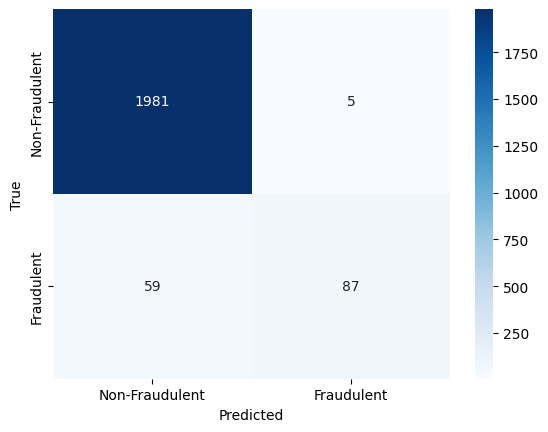

In [ ]:
#Confusion Matrix
cm2 = metrics.confusion_matrix(y_test, y_pred)

# Creating a heatmap for better visualization
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'],
            yticklabels=['Non-Fraudulent', 'Fraudulent'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Logistic Regression

### Modeling

In [ ]:
# Create a text classification pipeline
logit_text_clf = Pipeline([
    ('vect', count_vect),  # Text vectorization using CountVectorizer
    ('clf', LogisticRegression(n_jobs=1, C=1e5)),                # Logistic Regression classifier
])

# Fit the model on the training data
logit_text_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = logit_text_clf.predict(X_test)

### Model Evaluation

In [ ]:
#Precision Score
print('recall %s' % metrics.recall_score(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred, target_names=['Non-Fraudulent', 'Fraudulent']))

recall 0.8424657534246576
                precision    recall  f1-score   support

Non-Fraudulent       0.99      0.99      0.99      1986
    Fraudulent       0.90      0.84      0.87       146

      accuracy                           0.98      2132
     macro avg       0.94      0.92      0.93      2132
  weighted avg       0.98      0.98      0.98      2132



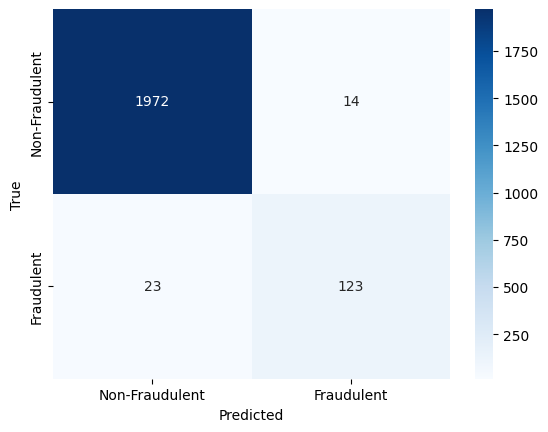

In [ ]:
#Confusion Matrix
cm3 = metrics.confusion_matrix(y_test, y_pred)

# Creating a heatmap for better visualization
sns.heatmap(cm3, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'],
            yticklabels=['Non-Fraudulent', 'Fraudulent'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Hyper-parameter Tuning

**We see that the Logistic Regression Model has the best recall score. We will do further hyper-parameters tuning for this model.**

### With GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
X_train_dtm = count_vect.fit_transform(X_train)
X_test_dtm = count_vect.transform(X_test)

In [ ]:
%%time
logistic_regression = LogisticRegression(
    random_state = 1,
    penalty = 'l2')

solver = ['lbfgs', 'newton-cg', 'liblinear']
warm_start = [True, False]
C = [0.001, 0.01, 0.1, 1, 10, 100]

# Define the hyperparameters you want to tune
param_grid = {
    'solver': solver,
    'warm_start': warm_start,
    'C': C
}

# Create the GridSearchCV object
grid_search = GridSearchCV(logistic_regression, param_grid, cv=5, scoring='recall')

# Fit the model
grid_search.fit(X_train_dtm, y_train)

CPU times: user 15min 55s, sys: 818 ms, total: 15min 56s
Wall time: 6min 29s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'solver': ['lbfgs', 'newton-cg', 'liblinear'],
                         'warm_start': [True, False]},
             scoring='recall')

In [ ]:
# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Get the best model
best_grid_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_grid_model.predict(X_test_dtm)

Best Hyperparameters: {'C': 100, 'solver': 'lbfgs', 'warm_start': True}


In [ ]:
# Evaluate the model
recall = metrics.recall_score(y_test, y_pred)
print("Recall:", recall)
print(metrics.classification_report(y_test, y_pred, target_names=['Non-Fraudulent', 'Fraudulent']))

Recall: 0.8424657534246576
                precision    recall  f1-score   support

Non-Fraudulent       0.99      0.99      0.99      1986
    Fraudulent       0.90      0.84      0.87       146

      accuracy                           0.98      2132
     macro avg       0.94      0.92      0.93      2132
  weighted avg       0.98      0.98      0.98      2132



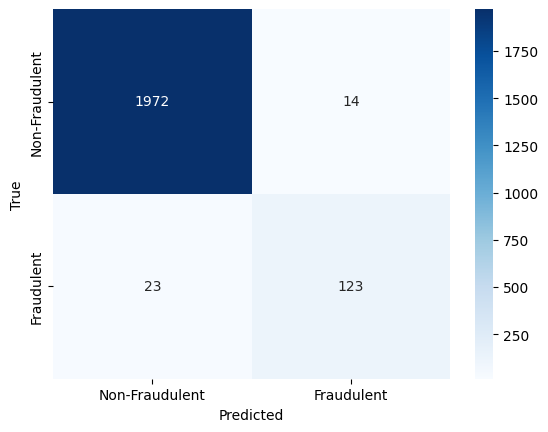

In [ ]:
#Confusion Matrix
cm4 = metrics.confusion_matrix(y_test, y_pred)

# Creating a heatmap for better visualization
sns.heatmap(cm4, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'],
            yticklabels=['Non-Fraudulent', 'Fraudulent'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
#Save the best SVM model to a pickle file
import pickle

with open("Best_Logit_CVGridSearch.pkl", "wb") as f:
    pickle.dump(best_grid_model, f)

### With RandomSearchCV

In [ ]:
#!pip install bayesian-optimization
from sklearn.model_selection import cross_val_score, RandomizedSearchCV

In [ ]:
%%time
estimator = LogisticRegression(
    random_state = 1,
    penalty = 'l2',
    max_iter = 2000
)

solver = ['lbfgs', 'newton-cg', 'liblinear']
warm_start = [True, False]
C = [0.001, 0.01, 0.1, 1, 10, 100]
random_grid ={
    'warm_start' : warm_start,
    'solver' : solver,
    'C' : C,
}

random_estimator = RandomizedSearchCV(estimator = estimator,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = 'recall',
                                   n_jobs = -1,
                                   verbose = 1,
                                   random_state = 1,
                                  )
random_estimator.fit(X_train_dtm, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
CPU times: user 25.6 s, sys: 3.18 s, total: 28.8 s
Wall time: 7min 38s


RandomizedSearchCV(estimator=LogisticRegression(max_iter=2000, random_state=1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                                        'solver': ['lbfgs', 'newton-cg',
                                                   'liblinear'],
                                        'warm_start': [True, False]},
                   random_state=1, scoring='recall', verbose=1)

In [ ]:
# Print the best parameters
print("Best Parameters: ", random_estimator.best_params_)

best_rand_model = random_estimator.best_estimator_

# Make predictions on the test set
y_pred = best_rand_model.predict(X_test_dtm)

# Evaluate accuracy and other metrics
print("Recall: ", metrics.recall_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Best Parameters:  {'warm_start': True, 'solver': 'liblinear', 'C': 10}
Recall:  0.8424657534246576

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1986
           1       0.90      0.84      0.87       146

    accuracy                           0.98      2132
   macro avg       0.95      0.92      0.93      2132
weighted avg       0.98      0.98      0.98      2132



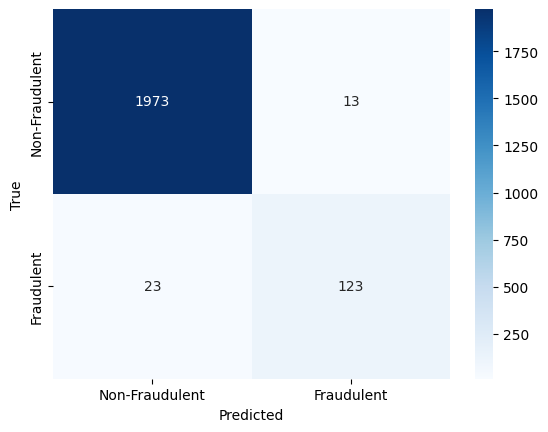

In [ ]:
#Confusion Matrix
cm5 = metrics.confusion_matrix(y_test, y_pred)

# Creating a heatmap for better visualization
sns.heatmap(cm5, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'],
            yticklabels=['Non-Fraudulent', 'Fraudulent'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
#Save the best model with Bayesian Optimization to a pickle file
import pickle

with open("Best_Logit_RandCV.pkl", "wb") as f:
    pickle.dump(best_rand_model, f)

In [ ]:
for key, value in best_grid_model.get_params().items():
    print(f'Param: {key}')
    print(f'Value: {value}')
    print('---')  # Separator line between key-value pairs

with open('Best_Logit_GridCV.txt', 'w') as file:
    for key, value in best_grid_model.get_params().items():
        # Write the key and value to the file
        file.write(f'Param: {key}\n')
        file.write(f'Value: {value}\n')
        file.write('---\n')  # Separator line between key-value pairs

Param: C
Value: 100
---
Param: class_weight
Value: None
---
Param: dual
Value: False
---
Param: fit_intercept
Value: True
---
Param: intercept_scaling
Value: 1
---
Param: l1_ratio
Value: None
---
Param: max_iter
Value: 100
---
Param: multi_class
Value: auto
---
Param: n_jobs
Value: None
---
Param: penalty
Value: l2
---
Param: random_state
Value: 1
---
Param: solver
Value: lbfgs
---
Param: tol
Value: 0.0001
---
Param: verbose
Value: 0
---
Param: warm_start
Value: True
---
